In [1]:
using Plots
using HTTP, CSV
using DataFrames: DataFrame
using AugmentedGaussianProcesses

## Loading the banana dataset from OpenML

In [2]:
data = HTTP.get("https://www.openml.org/data/get_csv/1586217/phpwRjVjk")
data = CSV.read(data.body)
data.Class[data.Class .== 2] .= -1
data = Matrix(data)
X = data[:, 1:2]
Y = data[:, end]

5300-element Array{Float64,1}:
  1.0
 -1.0
  1.0
 -1.0
 -1.0
 -1.0
  1.0
 -1.0
 -1.0
 -1.0
  ⋮
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
 -1.0
  1.0
 -1.0

## Run sparse classification with increasing number of inducing points

In [3]:
Ms = [4, 8, 16, 32, 64]
models = Vector{AbstractGP}(undef, length(Ms) + 1)
kernel = transform(SqExponentialKernel(), 1.0)
for (i, num_inducing) in enumerate(Ms)
    @info "Training with $(num_inducing) points"
    m = SVGP(X, Y,
            kernel,
            LogisticLikelihood(),
            AnalyticVI(),
            num_inducing,
            optimiser = false,
            Zoptimiser = false
        )
    @time train!(m, 20)
    models[i] = m
end

┌ Info: Training with 4 points
└ @ Main.##420 string:5
  3.409789 seconds (6.57 M allocations: 370.664 MiB, 2.58% gc time)
┌ Info: Training with 8 points
└ @ Main.##420 string:5
  0.140341 seconds (195.05 k allocations: 77.973 MiB, 35.45% gc time)
┌ Info: Training with 16 points
└ @ Main.##420 string:5
  0.201579 seconds (195.33 k allocations: 127.071 MiB, 13.84% gc time)
┌ Info: Training with 32 points
└ @ Main.##420 string:5
  0.336201 seconds (195.91 k allocations: 226.166 MiB, 5.87% gc time)
┌ Info: Training with 64 points
└ @ Main.##420 string:5
  0.635454 seconds (197.37 k allocations: 427.980 MiB, 3.36% gc time)


## Running the full model

In [4]:
@info "Running full model"
mfull = VGP(X, Y,
            kernel,
            LogisticLikelihood(),
            AnalyticVI(),
            optimiser = false
            )
@time train!(mfull, 5)
models[end] = mfull

┌ Info: Running full model
└ @ Main.##420 string:1
 89.876913 seconds (1.63 M allocations: 10.977 GiB, 1.49% gc time)


Variational Gaussian Process with a Bernoulli Likelihood with Logistic Link infered by Analytic Variational Inference 

Prediction and plot function on a grid

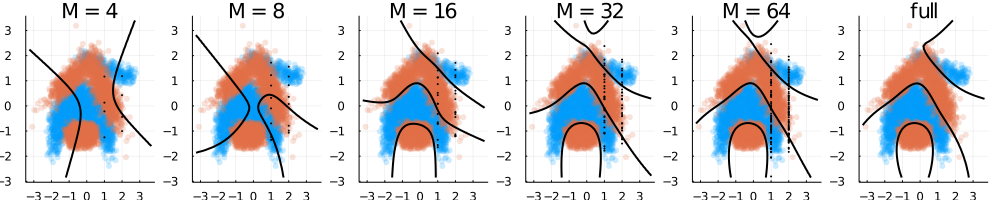

In [5]:
function compute_grid(model, n_grid=50)
    mins = [-3.25,-2.85]
    maxs = [3.65,3.4]
    x_lin = range(mins[1], maxs[1], length=n_grid)
    y_lin = range(mins[2], maxs[2], length=n_grid)
    x_grid = Iterators.product(x_lin, y_lin)
    y_grid, _ =  proba_y(model,vec(collect.(x_grid)))
    return y_grid, x_lin, y_lin
end

function plot_data(X, Y)
    Plots.scatter(eachcol(X)...,
                group = Y,
                alpha=0.2,
                markerstrokewidth=0.0,
                lab="",
                size=(300,500)
            )
end

function plot_model(model, X, Y, title = nothing)
    n_grid = 50
    y_pred, x_lin, y_lin = compute_grid(model, n_grid)
    title = if isnothing(title)
        (model isa SVGP ? "M = $(AGP.dim(model[1]))" : "full")
    else
        title
    end
    p = plot_data(X, Y)
    Plots.contour!(p,
                x_lin, y_lin,
                reshape(y_pred, n_grid, n_grid)',
                cbar=false, levels=[0.5],
                fill=false, color=:black,
                linewidth=2.0,
                title=title
                )
    if model isa SVGP
        Plots.scatter!(p,
                    AGP.Zview(model[1]),
                    msize=2.0, color="black",
                    lab="")
    end
    return p
end

Plots.plot(plot_model.(models, Ref(X), Ref(Y))...,
            layout=(1, length(models)),
            size=(1000, 200)
            )

## Comparison with Bayesian SVM

In [6]:
mbsvm = SVGP(X, Y,
            kernel,
            BayesianSVM(),
            AnalyticVI(),
            100,
            optimiser = false
            )
@time train!(mbsvm, 5)

  1.050789 seconds (1.63 M allocations: 210.917 MiB)


## Comparison with Logistic likelihood

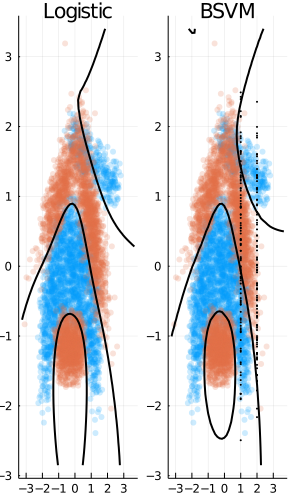

In [7]:
Plots.plot(plot_model.([models[end], mbsvm], Ref(X), Ref(Y), ["Logistic", "BSVM"])...,
            layout=(1, 2))

---

*This notebook was generated using [Literate.jl](https://github.com/fredrikekre/Literate.jl).*